## Understanding image binarization (converting to black&white in high contrast)

The goal of this notebook is to better understand the consecutive steps in the process of binarizing Kuzushiji script pages described by Kaggle user Baasit in [his notebook](https://www.kaggle.com/pr1c3f1eld/data-cleaning-and-pre-processing). 

In [19]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import PIL
%matplotlib inline
import os
import seaborn as sns
import cv2

In [8]:
dataPath = "./data"
train = pd.read_csv(os.path.join(dataPath, "train.csv").replace("\\","/"))
character_dict = pd.read_csv(os.path.join(dataPath, "unicode_translation.csv").replace("\\","/"))

In [14]:
class JapChar():
    def __init__(self, char_data, im_id):
        self.char = char_data[0]
        self.x = int(char_data[1])
        self.y = int(char_data[2])
        self.width = int(char_data[3])
        self.height = int(char_data[4])
        self.im_id = im_id
        
    def get_area(self):
        return self.width * self.height

    def get_file(self):
        return "./data/train/" + self.im_id + ".jpg";
    
    def get_top_left(self):
        return [self.x, self.y]
    
    def get_bottom_right(self):
        return [self.x + self.width, self.y + self.height]
    
    def show(self):
        plt.figure(figsize = (6, 6))
        im = PIL.Image.open(self.get_file())
        im = im.crop(self.get_top_left()  + self.get_bottom_right())
        plt.imshow(im)

class ScripturePage:
    def __init__(self, im_data):
        self.id = im_data[0]
        if type(im_data[1]) is not float:
            split_labels = im_data[1].split()
            self.labels = [JapChar(split_labels[i: i+5], self.id) for i in range(0, len(split_labels), 5)]
        else:
            self.labels = []
        
    def get_file(self):
        return "./data/train/" + self.id + ".jpg";
    
    def show(self):
        plt.figure(figsize  = (10, 10))
        plt.imshow(plt.imread(self.get_file()))
        
    def get_im(self):
        return PIL.Image.open(self.get_file());
    
    def show_labeled(self):
        plt.figure(figsize  = (10, 10))
        ax = plt.gca()
        plt.imshow(self.get_im())
        
        for label in self.labels:
            box = Rectangle((label.x, label.y), label.width, label.height, fill = False, edgecolor = 'r')
            ax.add_patch(box)
            
        plt.show()

In [15]:
data = [ScripturePage(train.loc[i]) for i in range(len(train))]

Example of a single character and page

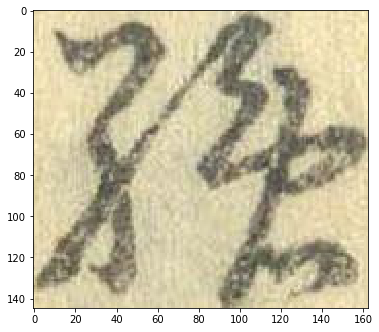

In [16]:
page = data[0]
page.labels[25].show()

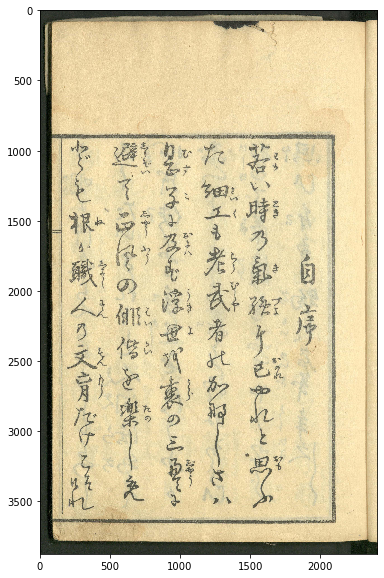

In [17]:
page.show()

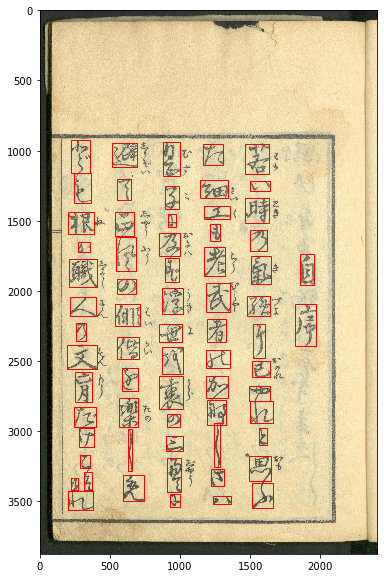

In [18]:
page.show_labeled()

In [48]:
def test_print(image):
    plt.figure(figsize=(20,20))
    plt.imshow(image)

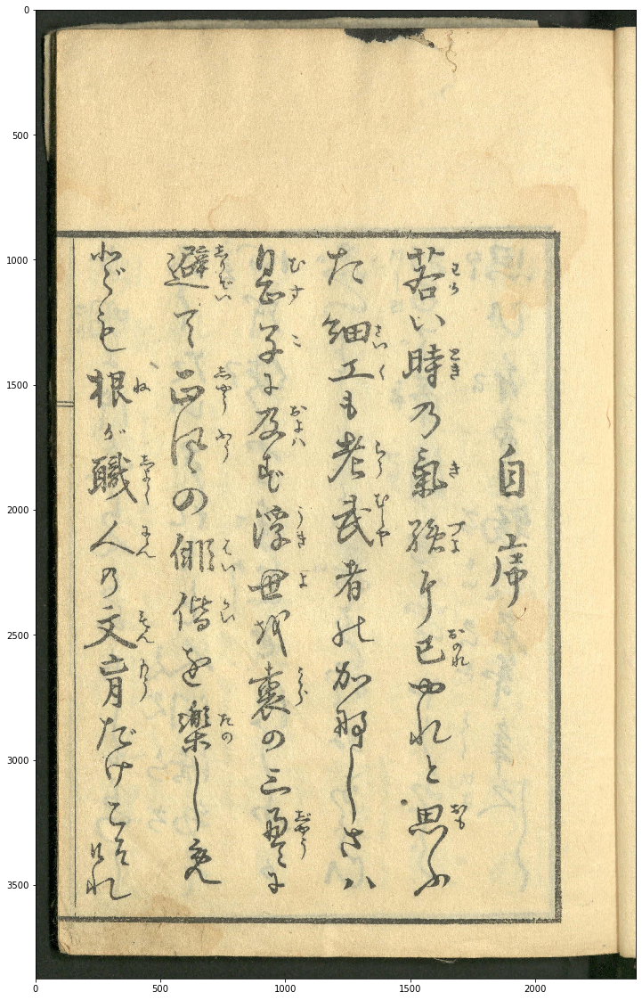

In [74]:
img_0_orig = cv2.imread(page.get_file())
img_0_orig = cv2.cvtColor(img_0_orig, cv2.COLOR_BGR2RGB)
test_print(img_0_orig)

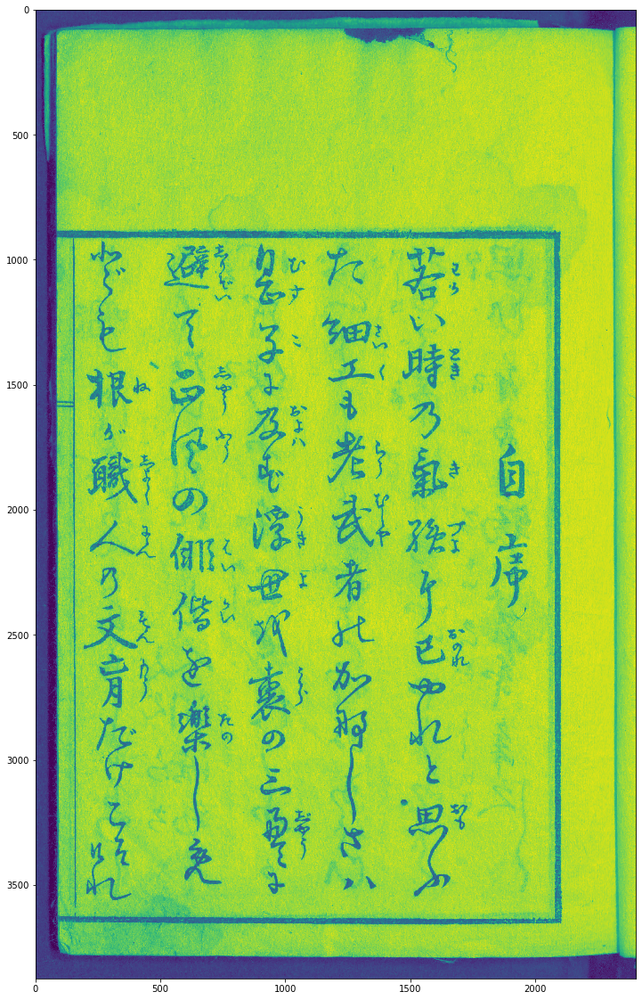

In [75]:
img_0 = cv2.imread(page.get_file())
img_0 = cv2.cvtColor(img_0, cv2.COLOR_BGR2GRAY)
test_print(img_0)

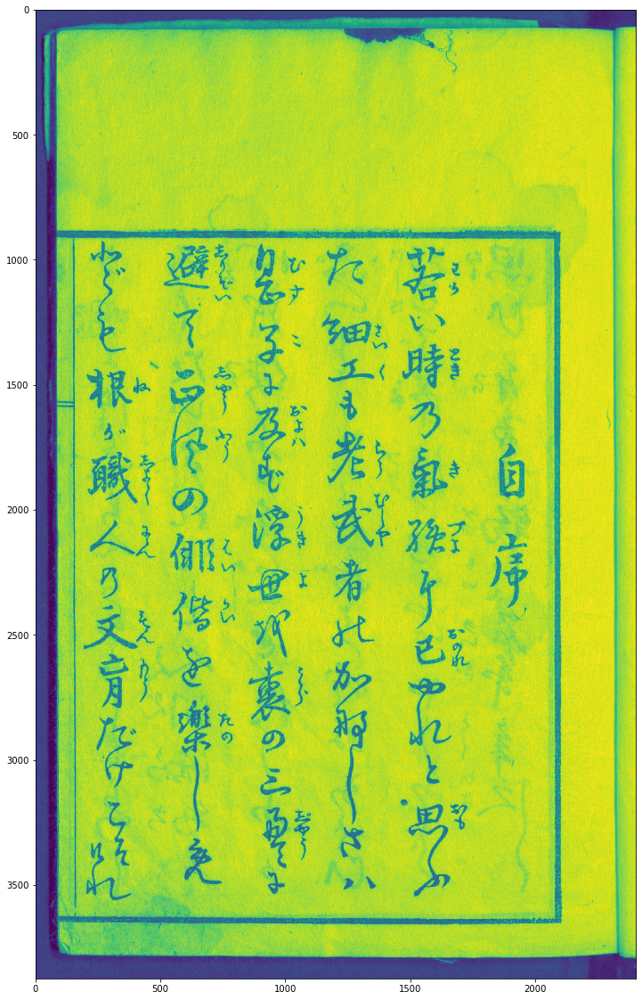

In [51]:
blur = cv2.GaussianBlur(img_0,(3,3),0)
test_print(blur)

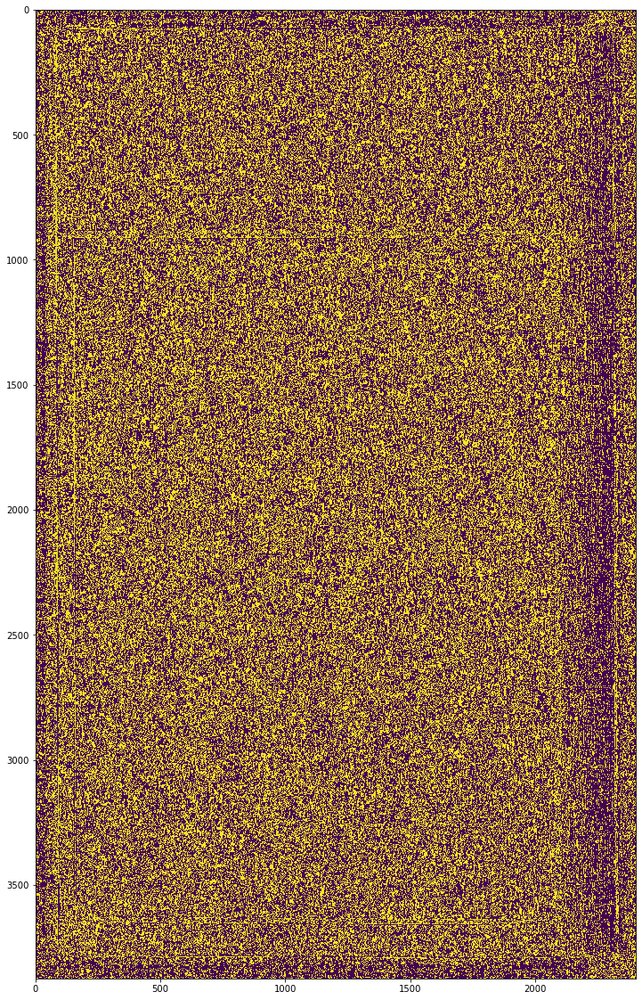

In [52]:
sharp_mask = np.subtract(img_0, blur)
test_print(sharp_mask)

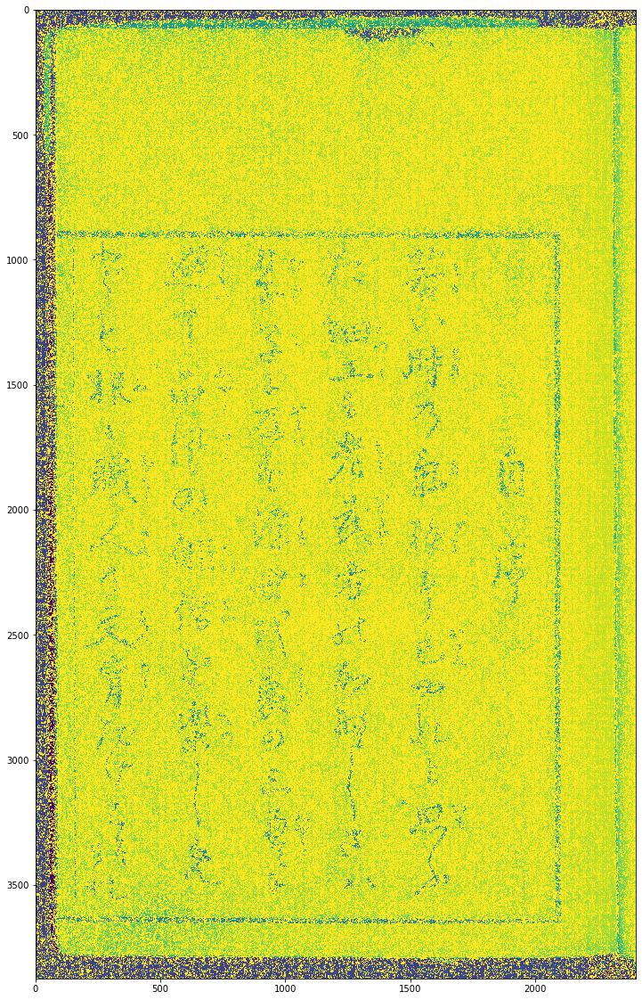

In [53]:
img_0 = cv2.addWeighted(img_0,1, sharp_mask,10, 0)
test_print(img_0)

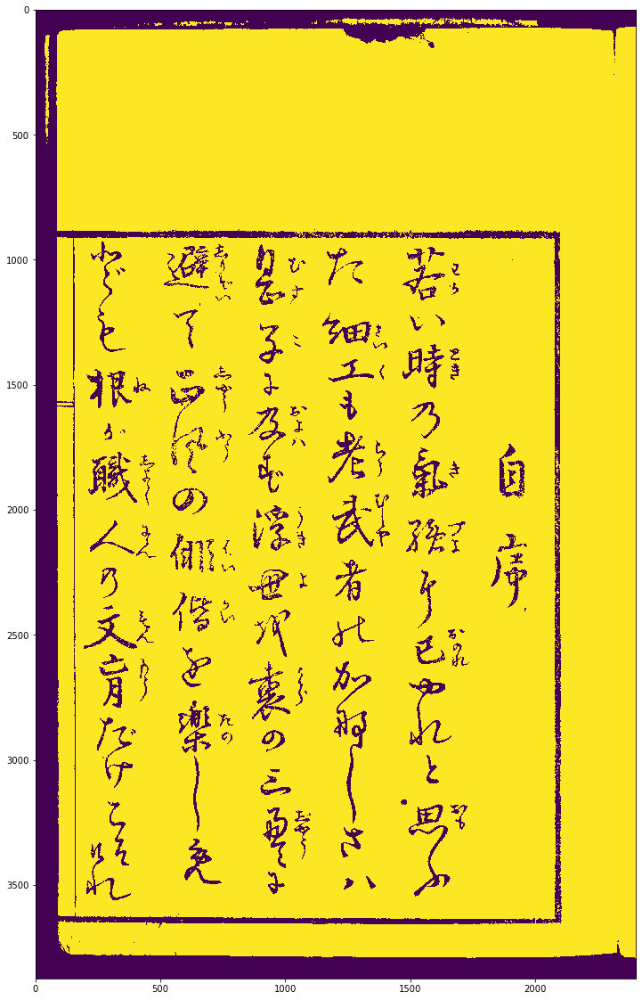

In [54]:
ret,th = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
test_print(th)

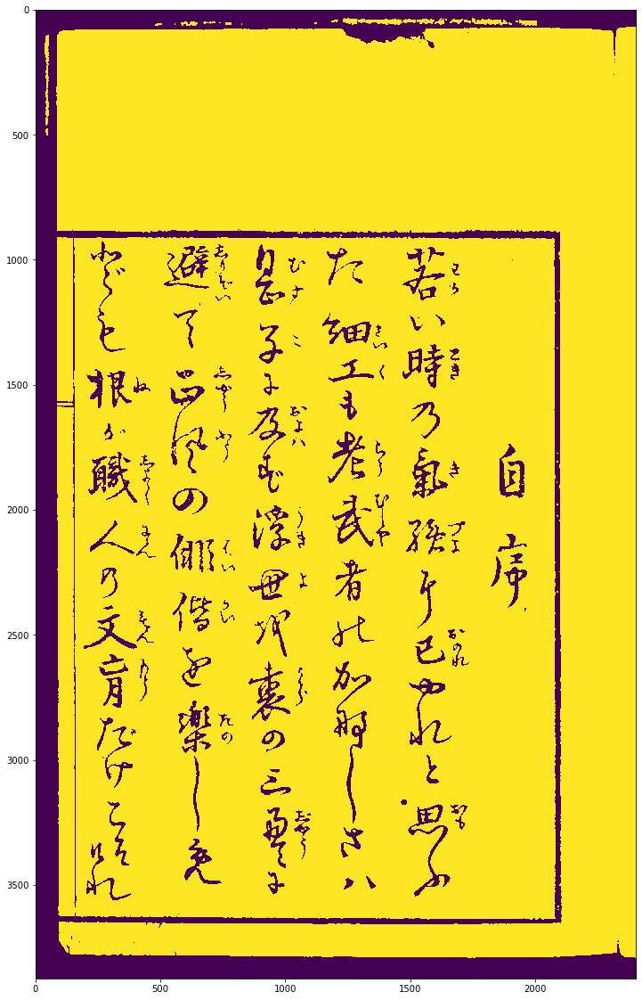

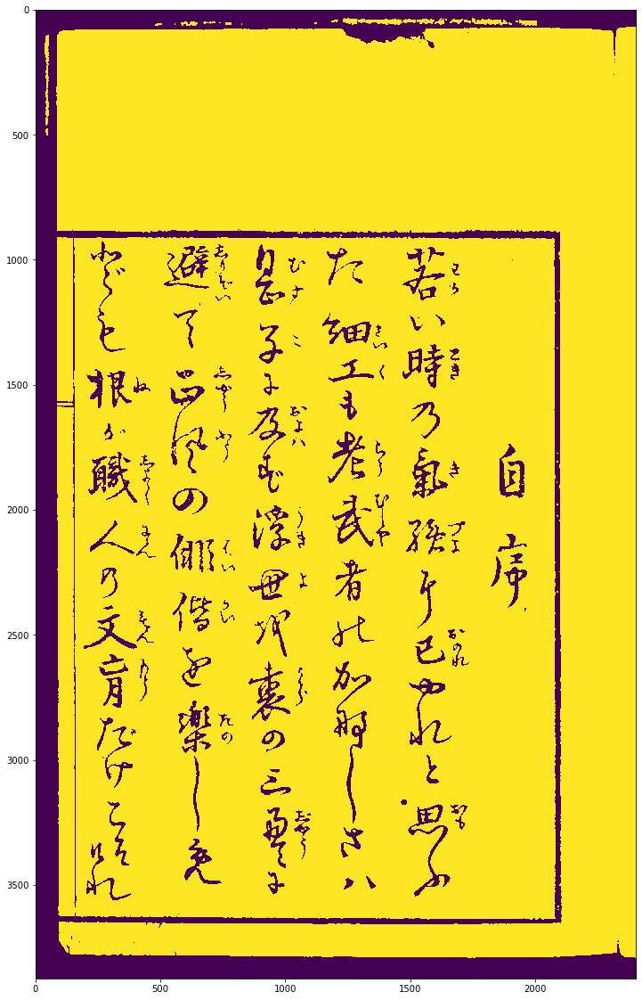

In [55]:
kernel_1 = np.ones((5,5),np.uint8)
kernel_2 = np.ones((1,1),np.uint8)
opening = cv2.morphologyEx(th, cv2.MORPH_OPEN, kernel_1)
closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel_2)
test_print(opening)
test_print(closing)

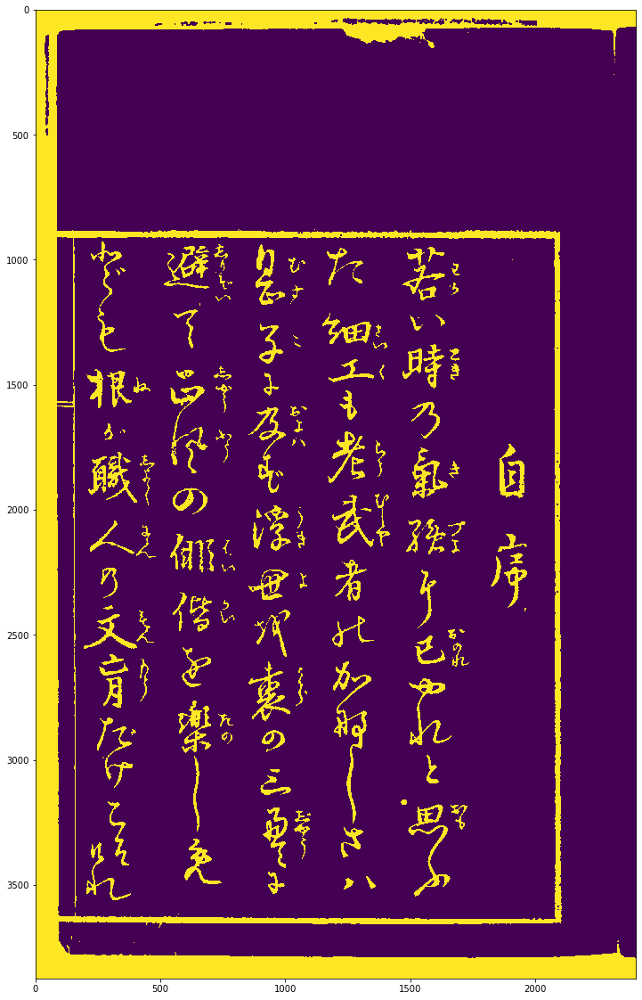

In [56]:
mask = cv2.bitwise_not(closing)
test_print(mask)

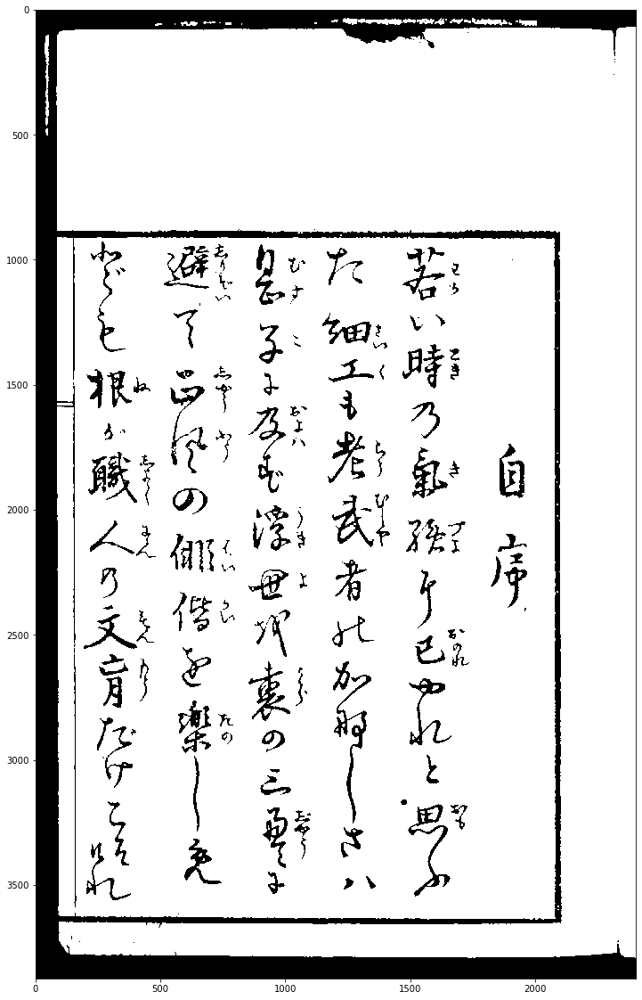

In [57]:
mask = cv2.cvtColor(closing, cv2.COLOR_GRAY2RGB)
test_print(mask)

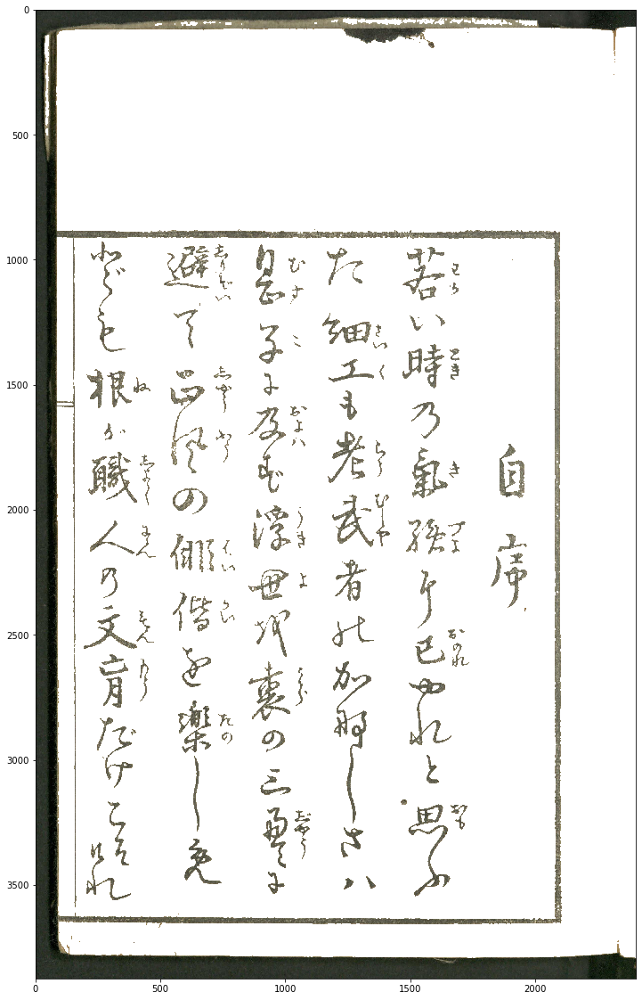

In [58]:
img = cv2.add(img_0_orig,mask)
test_print(img)

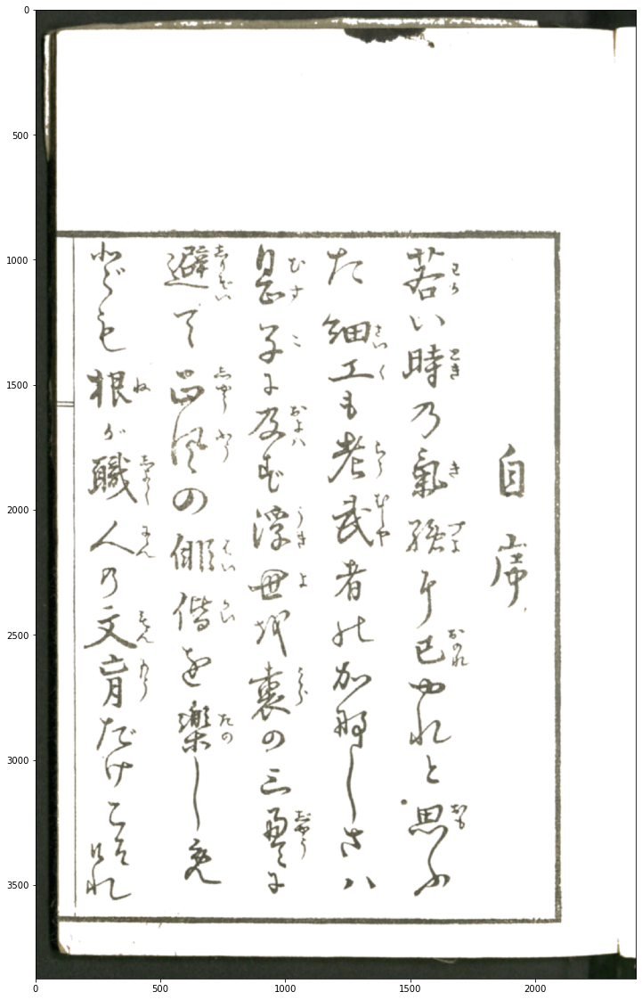

In [59]:
blur_1 = cv2.GaussianBlur(img, (13,13), 0)
test_print(blur_1)

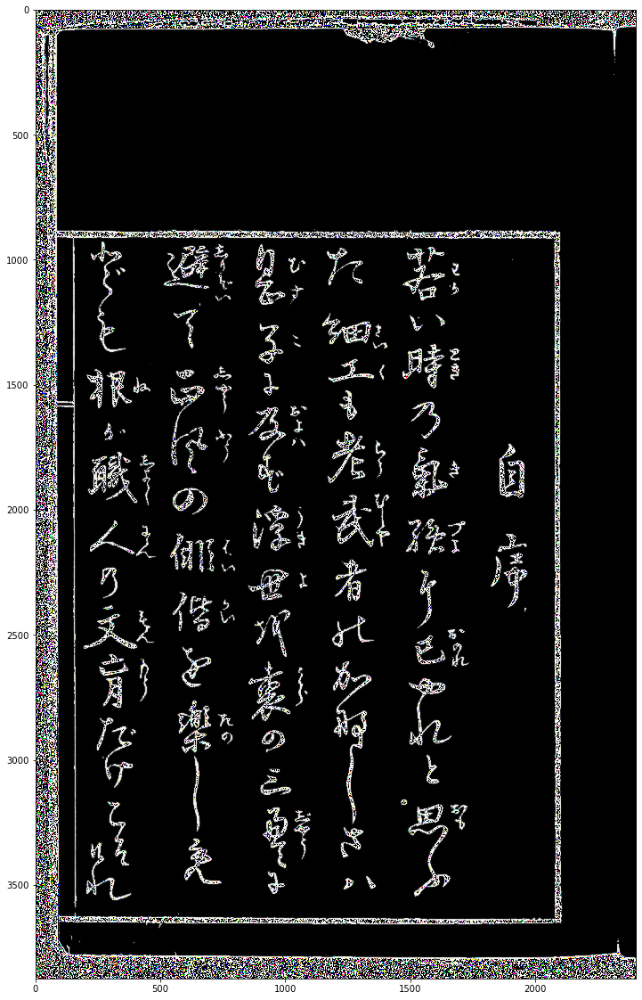

In [60]:
sharp_mask_1 = np.subtract(img,blur_1)
test_print(sharp_mask_1)

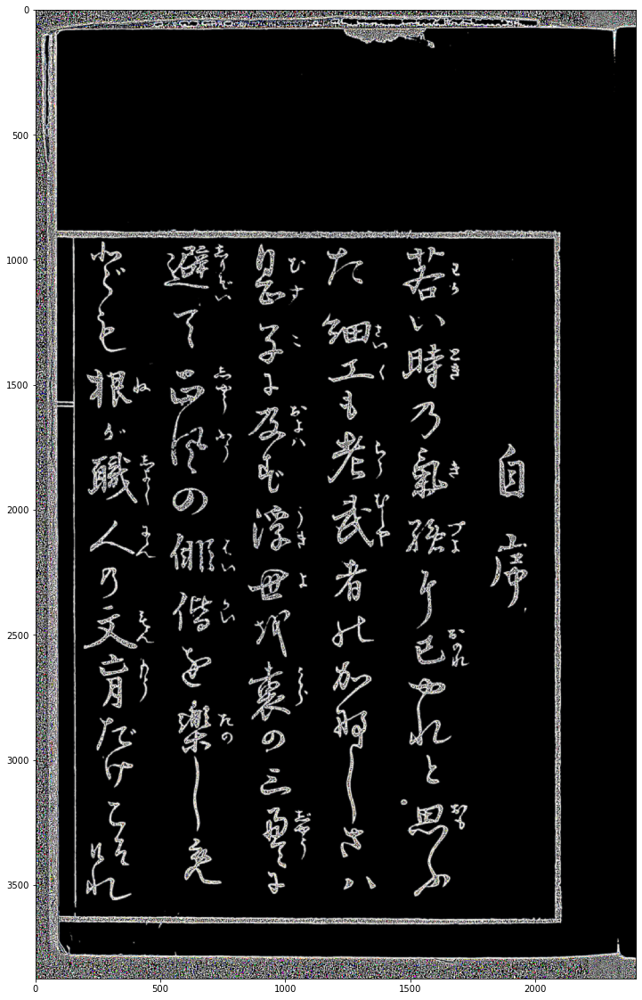

In [61]:
sharp_mask_1 = cv2.GaussianBlur(sharp_mask_1, (7,7), 0)
test_print(sharp_mask_1)

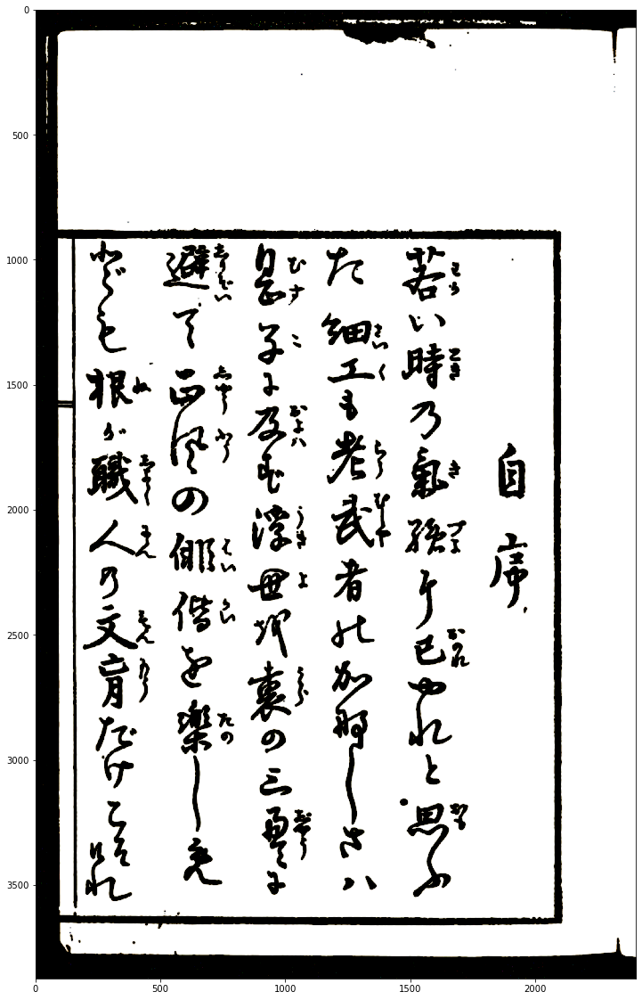

In [62]:
img = cv2.addWeighted(img,1,sharp_mask_1,-10, 0)
test_print(img)

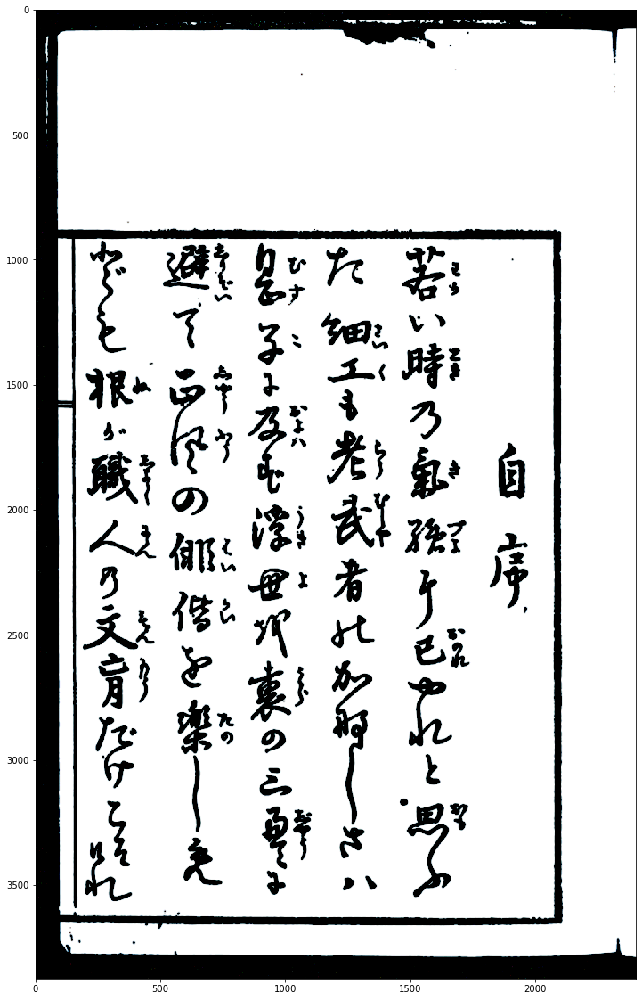

In [63]:
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
test_print(img)